# 11 TBI mapping

## Notebook setup

In [1]:
import warnings
warnings.filterwarnings('ignore')

import scanpy as sc
import scanpy.external as sce
import numpy as np
import pandas as pd
import warnings, scipy.sparse as sp, matplotlib, matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.pyplot import rc_context
from collections import Counter
import matplotlib.font_manager
import openpyxl
import pyreadr
import rpy2
from rpy2.robjects.packages import importr
import rpy2.robjects as robjects
#import magic
#import seaborn as sns
import palantir
import loompy
import feather
import re
#from scipy.sparse import csgraph

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = 'Arial'
matplotlib.rc('font', size=14)
import matplotlib.lines as lines

pd.set_option('display.max_rows', 200)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.20.2 scipy==1.5.3 pandas==1.4.4 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.9.11 pynndescent==0.5.7


In [2]:
user_defined_palette =  [ '#F6222E', '#FEAF16','#3283FE','#BDCDFF', '#3B00FB', '#F8A19F', '#1CFFCE',  '#C4451C', 
                          '#2ED9FF', '#c1c119', '#8b0000', '#FE00FA', '#1CBE4F','#B5EFB5', '#0e452b', '#AA0DFE']

In [3]:
user_defined_cmap_markers = LinearSegmentedColormap.from_list('mycmap', ["#E6E6FF", "#CCCCFF", "#B2B2FF", "#9999FF",  "#6666FF",   "#3333FF", "#0000FF"])
user_defined_cmap_degs = LinearSegmentedColormap.from_list('mycmap', ["#0000FF", "#3333FF", "#6666FF", "#9999FF", "#B2B2FF", "#CCCCFF", "#E6E6FF", "#E6FFE6", "#CCFFCC", "#B2FFB2", "#99FF99", "#66FF66", "#33FF33", "#00FF00"])

In [4]:
%matplotlib inline 

## Load data for Fig S13

In [5]:
path_to_h5ad = '../output/anndata_io/FigED10a.h5ad

In [6]:
adata_d147 = sc.read_h5ad(path_to_h5ad)
adata_d147.uns['log1p']["base"] = None

In [7]:
adata_d147.shape

(58309, 27893)

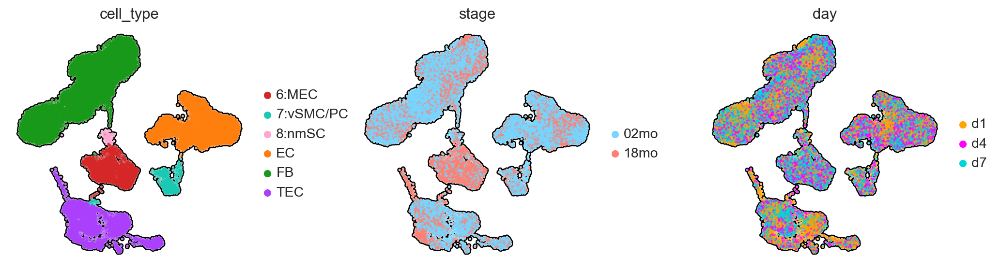

In [8]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)

sc.pl.umap(adata_d147, color=['cell_type', 'stage', 'day'], 
                     color_map='Spectral_r',
                     use_raw=False, 
                     ncols=4, 
                     wspace = 0.3,
                     outline_width=[0.6, 0.05], 
                     size=15,  
                     frameon=False, 
                     add_outline=True, 
                     sort_order = False
)

## Analyze TEC, FB and EC and annotate based on public marker genes and signatures

### Our EC

In [9]:
EC_d147 = adata_d147[(adata_d147.obs['cell_type']=='EC')]

In [10]:
# Remove columns with all 0s
sc.pp.filter_genes(EC_d147, min_cells=1)

filtered out 6296 genes that are detected in less than 1 cells


#### Identify highly variable genes (all samples but day 1) and replot the data

In [11]:
EC_d47 = EC_d147[EC_d147.obs['day']!='d1']

In [12]:
# Remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(EC_d47, min_cells=1)

filtered out 1119 genes that are detected in less than 1 cells


In [13]:
sc.pp.highly_variable_genes(EC_d47, n_top_genes=3500, flavor='seurat')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [14]:
hvgs = EC_d47.var[EC_d47.var['highly_variable']==True].index

In [15]:
EC_d147.var['highly_variable'] = ''

In [16]:
EC_d147.var['highly_variable'] = [True if x in hvgs else False for x in EC_d147.var['highly_variable'].index]

In [17]:
rng = np.random.RandomState(42)
sc.tl.pca(EC_d147, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:02)


<function matplotlib.pyplot.show(close=None, block=None)>

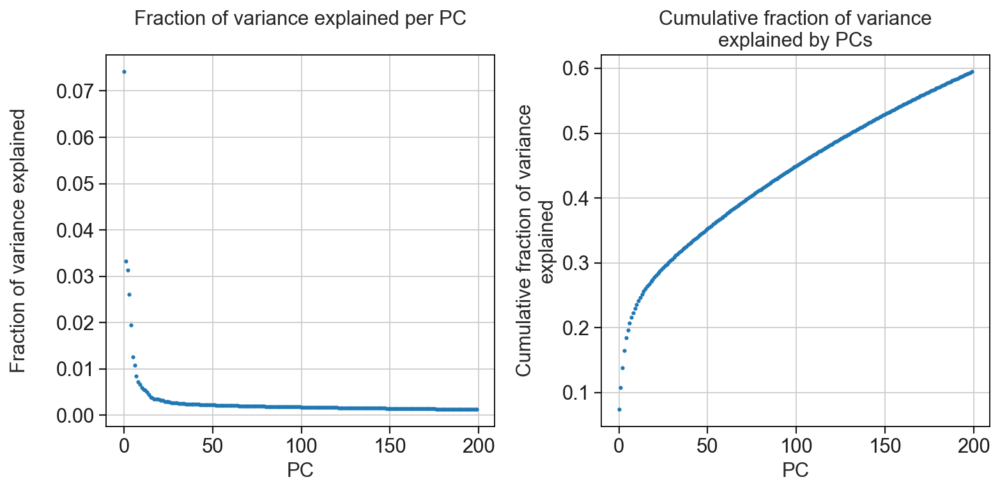

In [18]:
def observe_variance(anndata_object):
    fig = plt.figure(figsize=(10,5))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    # variance per principal component
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = anndata_object.uns['pca']['variance_ratio']
    ax1.scatter(x,y,s=4)
    ax1.set_xlabel('PC')
    ax1.set_ylabel('Fraction of variance explained\n')
    ax1.set_title('Fraction of variance explained per PC\n')
    # cumulative variance explained
    cml_var_explained = np.cumsum(anndata_object.uns['pca']['variance_ratio'])
    x = range(len(anndata_object.uns['pca']['variance_ratio']))
    y = cml_var_explained
    ax2.scatter(x,y,s=4)
    ax2.set_xlabel('PC')
    ax2.set_ylabel('Cumulative fraction of variance\nexplained')
    ax2.set_title('Cumulative fraction of variance\nexplained by PCs')
    fig.tight_layout()
    plot = plt.show
    return(plot)
observe_variance(EC_d147)

In [19]:
rng = np.random.RandomState(42)
sc.tl.pca(EC_d147, n_comps=35, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=35
    finished (0:00:00)


In [20]:
sce.pp.harmony_integrate(EC_d147, 'sample')

2024-04-11 10:10:33,464 - harmonypy - INFO - Iteration 1 of 10
2024-04-11 10:10:35,681 - harmonypy - INFO - Iteration 2 of 10
2024-04-11 10:10:37,715 - harmonypy - INFO - Iteration 3 of 10
2024-04-11 10:10:39,813 - harmonypy - INFO - Iteration 4 of 10
2024-04-11 10:10:41,911 - harmonypy - INFO - Iteration 5 of 10
2024-04-11 10:10:43,603 - harmonypy - INFO - Iteration 6 of 10
2024-04-11 10:10:45,912 - harmonypy - INFO - Iteration 7 of 10
2024-04-11 10:10:48,152 - harmonypy - INFO - Iteration 8 of 10
2024-04-11 10:10:49,337 - harmonypy - INFO - Iteration 9 of 10
2024-04-11 10:10:50,417 - harmonypy - INFO - Iteration 10 of 10
2024-04-11 10:10:51,569 - harmonypy - INFO - Stopped before convergence


In [21]:
sc.pp.neighbors(EC_d147, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(EC_d147)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


### EC signatures at steady state

In [22]:
artEC_sign = ['Fbln5',	'Stmn2',	'Clu',	'Sema3g',	'Glul',	'Tm4sf1',	'Eps8l2',	'Col8a1',	'Nebl',	'Vegfc',	'Alpl',	'Arl15',	'Gja4',	'Edn1',	'S100a6',	'Mast4',	'Sox17',	'Pdgfd',	'Fbln2',	'Vim']
capEC_sign = ['Gpihbp1',	'Rgcc',	'Fabp4',	'Cd36',	'Car4',	'Mgll',	'Cd300lg',	'Tcf15',	'Kdr',	'Arhgap18',	'Igfbp7',	'Kank3',	'Aqp7',	'Etl4',	'Tspan13',	'Cavin2',	'Hspb1',	'Ppp1r2',	'Lims2',	'Fabp5']
venEC_sign = ['Lrg1',	'Il6st',	'Vwf',	'Plvap',	'mt-Co1',	'Selp',	'Spint2',	'Pcdh7',	'mt-Nd4',	'2200002D01Rik',	'Tmsb10',	'Eef1a1',	'mt-Co3',	'Bgn',	'Pde4d',	'mt-Atp6',	'Aqp1',	'Tpt1',	'Ctla2a',	'Ackr1']

In [23]:
x=19
sc.tl.score_genes(EC_d147, gene_list = artEC_sign[0:x],  score_name='artEC_sign', use_raw=False)
sc.tl.score_genes(EC_d147, gene_list = capEC_sign[0:x],  score_name='capEC_sign', use_raw=False)
sc.tl.score_genes(EC_d147, gene_list = venEC_sign[0:x],  score_name='venEC_sign', use_raw=False)

computing score 'artEC_sign'
    finished: added
    'artEC_sign', score of gene set (adata.obs).
    248 total control genes are used. (0:00:00)
computing score 'capEC_sign'
    finished: added
    'capEC_sign', score of gene set (adata.obs).
    49 total control genes are used. (0:00:00)
computing score 'venEC_sign'
    finished: added
    'venEC_sign', score of gene set (adata.obs).
    149 total control genes are used. (0:00:00)


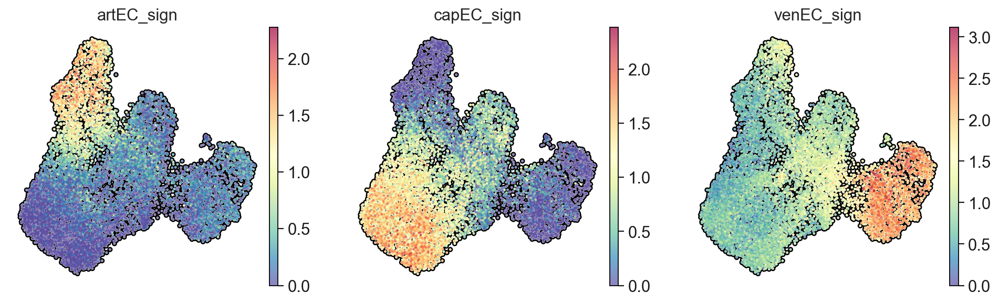

In [24]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    EC_d147,
    color=['artEC_sign', 'capEC_sign', 'venEC_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    size=15,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order=True,
    vmin=0    
)

### EC clustering and annotation

In [25]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(EC_d147, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:01)
running Leiden clustering
 

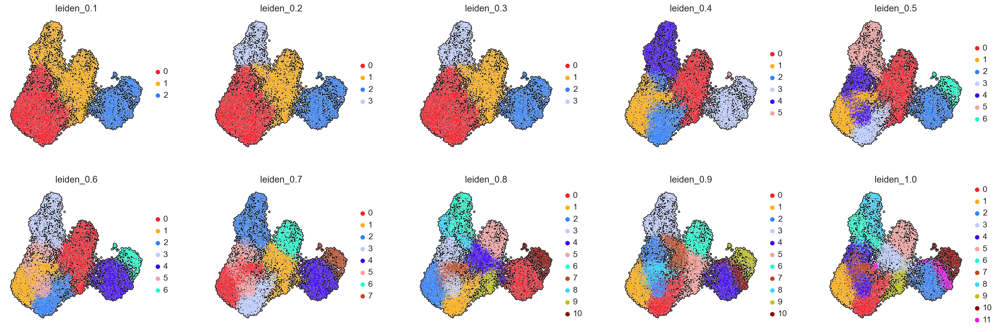

In [26]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    EC_d147, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8','leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [27]:
EC_d147.obs['cell_type_subset'] = ['0:arEC' if (x=='3') else 
                                 '1:capEC' if (x=='0' or x=='1') else
                                 '2:venEC' if (x=='2') else 'ERROR' for x in EC_d147.obs['leiden_0.2']] 

In [28]:
EC_d147.uns['cell_type_subset_colors'] = ['#F6222E', '#3283FE', '#16FF32']

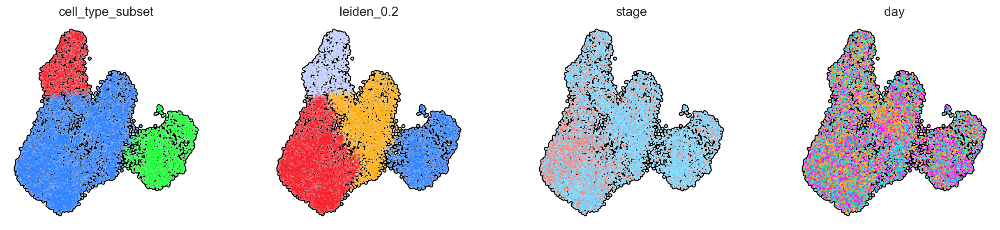

In [29]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    EC_d147, 
    color=['cell_type_subset','leiden_0.2', 'stage', 'day'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    frameon=False,
    size=15,
    cmap='Spectral_r',
    wspace = 0.2,
    add_outline=True,
    legend_loc='none'
)

In [30]:
path_to_h5ad = '../output/anndata_io/FigED10b.h5ad'

In [31]:
EC_d147.write(path_to_h5ad)

### Our FB

In [32]:
FB_d147 = adata_d147[(adata_d147.obs['cell_type']=='FB')]

In [33]:
# Remove columns with all 0s
sc.pp.filter_genes(FB_d147, min_cells=1)

filtered out 3543 genes that are detected in less than 1 cells


#### Identify highly variable genes (all samples but day 1) and replot the data

In [34]:
FB_d47 = FB_d147[FB_d147.obs['day']!='d1']

In [35]:
# Remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(FB_d47, min_cells=1)

filtered out 1375 genes that are detected in less than 1 cells


In [36]:
sc.pp.highly_variable_genes(FB_d47, n_top_genes=3500, flavor='seurat')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [37]:
hvgs = FB_d47.var[FB_d47.var['highly_variable']==True].index

In [38]:
FB_d147.var['highly_variable'] = ''

In [39]:
FB_d147.var['highly_variable'] = [True if x in hvgs else False for x in FB_d147.var['highly_variable'].index]

In [40]:
rng = np.random.RandomState(42)
sc.tl.pca(FB_d147, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:08)


<function matplotlib.pyplot.show(close=None, block=None)>

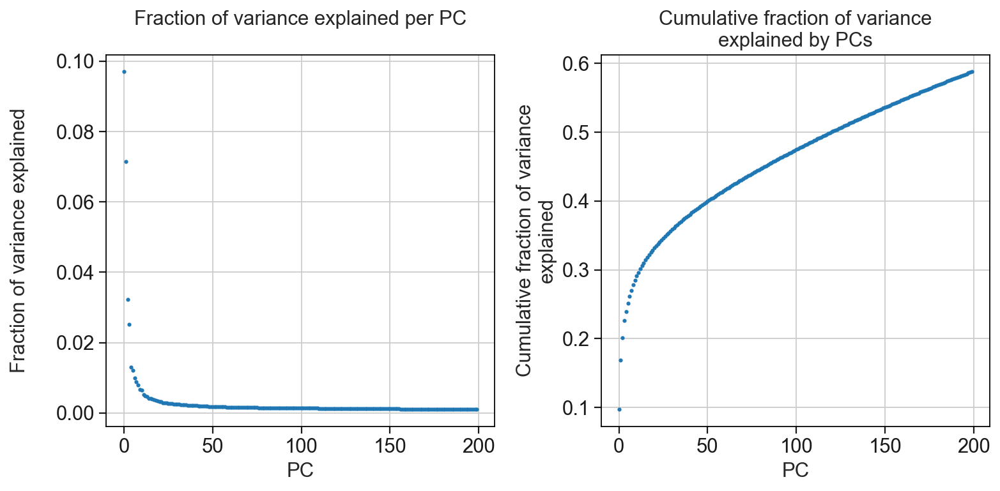

In [41]:
observe_variance(FB_d147)

In [42]:
rng = np.random.RandomState(42)
sc.tl.pca(FB_d147, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:01)


In [43]:
sce.pp.harmony_integrate(FB_d147, 'sample')

2024-04-11 10:12:12,795 - harmonypy - INFO - Iteration 1 of 10
2024-04-11 10:12:18,405 - harmonypy - INFO - Iteration 2 of 10
2024-04-11 10:12:23,717 - harmonypy - INFO - Iteration 3 of 10
2024-04-11 10:12:29,217 - harmonypy - INFO - Converged after 3 iterations


In [44]:
sc.pp.neighbors(FB_d147, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(FB_d147)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    FB_d147, 
    color=['Adipoq'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.3,
    add_outline=True,
    use_raw=False
)

### FB clustering and annotation

In [46]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]:
    sc.tl.leiden(FB_d147, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 2 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:02)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
 

In [ ]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    FB_d147, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8','leiden_0.9', 'leiden_1.0'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [48]:
FB_d147.obs['cell_type_subset'] = ['3:capsFB' if (x=='1') else 
                                   '4:intFB' if (x=='2' or x=='3' or x=='4') else
                                   '5:medFB' if (x=='0') else
                                   '9:Fat' if (x=='5') else 'ERROR' for x in FB_d147.obs['leiden_0.4']] 

In [49]:
FB_d147.uns['cell_type_subset_colors'] = ['#BDCDFF', '#AA0DFE', '#1CFFCE', 'grey']

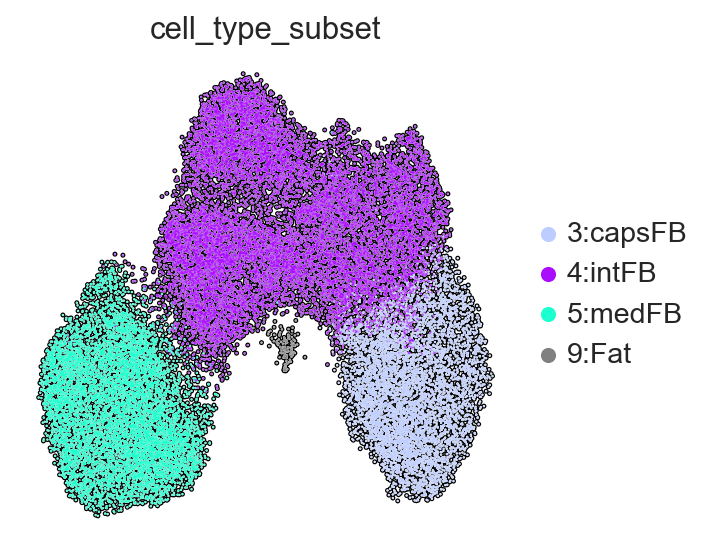

In [50]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    FB_d147, 
    color=['cell_type_subset'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.3,
    add_outline=True
)

In [51]:
FB_d147_nofat = FB_d147[(FB_d147.obs['cell_type_subset']!='9:Fat')]

In [52]:
# Remove columns with all 0s
sc.pp.filter_genes(FB_d147_nofat, min_cells=1)

filtered out 30 genes that are detected in less than 1 cells


In [53]:
sc.pp.highly_variable_genes(FB_d147_nofat, n_top_genes=3500, n_bins=20, flavor='seurat')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [54]:
rng = np.random.RandomState(42)
sc.tl.pca(FB_d147_nofat, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:08)


<function matplotlib.pyplot.show(close=None, block=None)>

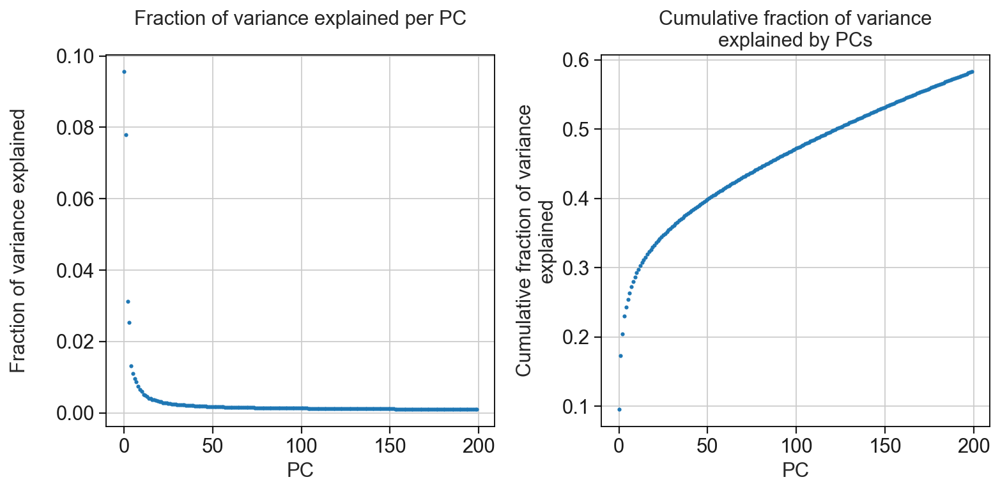

In [55]:
observe_variance(FB_d147_nofat)

In [56]:
rng = np.random.RandomState(42)
sc.tl.pca(FB_d147_nofat, n_comps=30, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=30
    finished (0:00:01)


In [57]:
sce.pp.harmony_integrate(FB_d147_nofat, 'sample')

2024-04-11 10:13:56,475 - harmonypy - INFO - Iteration 1 of 10
2024-04-11 10:14:02,251 - harmonypy - INFO - Iteration 2 of 10
2024-04-11 10:14:07,492 - harmonypy - INFO - Iteration 3 of 10
2024-04-11 10:14:15,017 - harmonypy - INFO - Converged after 3 iterations


In [58]:
sc.pp.neighbors(FB_d147_nofat, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(FB_d147_nofat)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:23)


### FB signatures at steady state

In [59]:
capsFB_sign = ['Pi16',	'Timp2',	'Fn1',	'Opcml',	'Cd248',	'Mfap5',	'Anxa3',	'Pcolce2',	'Ackr3',	'Fndc1',	'Igfbp6',	'Sema3c',	'Clec3b',	'Creb5',	'Smpd3',	'Tmem100',	'Adgrd1',	'Ly6c1',	'Pcsk6',	'Nid1']
intFB_sign = ['Smoc2',	'Gpx3',	'Penk',	'Igf1',	'Gas1',	'Inmt',	'Pcolce',	'Lrp1',	'Itm2a',	'Gdf10',	'Rbp1',	'Fbln1',	'Sfrp1',	'Slit3',	'Svep1',	'Auts2',	'Lpl',	'Celf2',	'Serpinf1',	'Il11ra1']
medFB_sign = ['Csmd1',	'Serpine2',	'Enpp2',	'Ptn',	'Tmem176b',	'Tmem176a',	'B2m',	'Ccl19',	'Igfbp7',	'Apod',	'Bgn',	'H2-D1',	'Des',	'Ltc4s',	'Lhfp',	'Ifitm1',	'Cd9',	'Apoe',	'Lsamp',	'Ly6e']

In [60]:
x=19
sc.tl.score_genes(FB_d147_nofat, gene_list = capsFB_sign[0:x],  score_name='capsFB_sign', use_raw=False)
sc.tl.score_genes(FB_d147_nofat, gene_list = intFB_sign[0:x],  score_name='intFB_sign', use_raw=False)
sc.tl.score_genes(FB_d147_nofat, gene_list = medFB_sign[0:x],  score_name='medFB_sign', use_raw=False)

computing score 'capsFB_sign'
    finished: added
    'capsFB_sign', score of gene set (adata.obs).
    147 total control genes are used. (0:00:01)
computing score 'intFB_sign'
    finished: added
    'intFB_sign', score of gene set (adata.obs).
    147 total control genes are used. (0:00:01)
computing score 'medFB_sign'
    finished: added
    'medFB_sign', score of gene set (adata.obs).
    107 total control genes are used. (0:00:01)


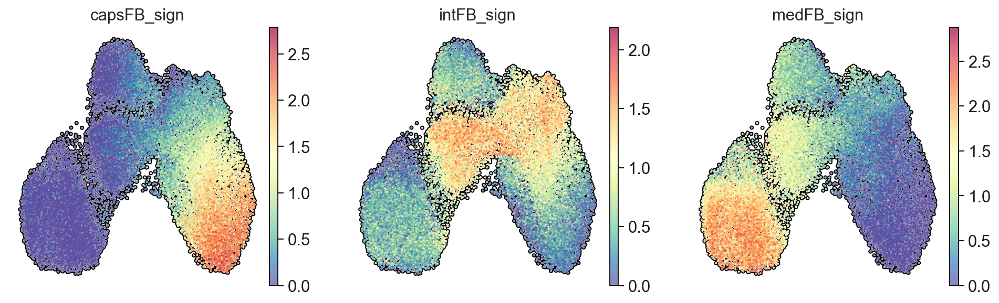

In [61]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    FB_d147_nofat,
    color=[ 'capsFB_sign', 'intFB_sign', 'medFB_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=10,
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

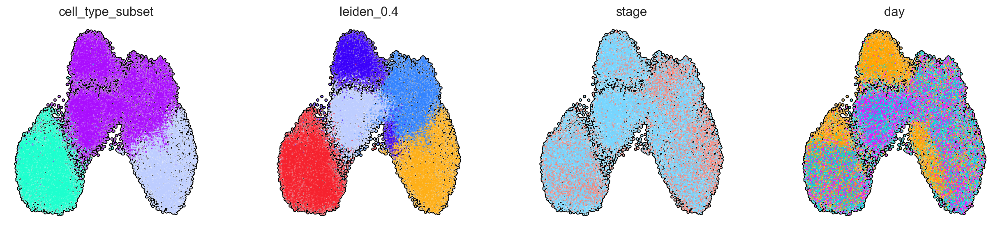

In [62]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    FB_d147_nofat, 
    color=['cell_type_subset','leiden_0.4', 'stage', 'day'], 
    ncols=6,
    outline_width=[0.6, 0.05],
    frameon=False,
    size=10,
    cmap='Spectral_r',
    wspace = 0.2,
    add_outline=True,
    legend_loc='none'
)

In [63]:
path_to_h5ad = '../output/anndata_io/FigED10c.h5ad'

In [64]:
FB_d147_nofat.write(path_to_h5ad)

### Our TEC

In [65]:
TEC_d147 = adata_d147[(adata_d147.obs['cell_type']=='TEC')]

In [66]:
# Remove columns with all 0s
sc.pp.filter_genes(TEC_d147, min_cells=1)

filtered out 1133 genes that are detected in less than 1 cells


#### Identify highly variable genes (all samples but day 1) and replot the data

In [67]:
TEC_d47 = TEC_d147[TEC_d147.obs['day']!='d1']

In [68]:
# Remove genes that are not expressed in any cells (remove columns with all 0s)
sc.pp.filter_genes(TEC_d47, min_cells=1)

filtered out 2295 genes that are detected in less than 1 cells


In [69]:
sc.pp.highly_variable_genes(TEC_d47, n_top_genes=3500, flavor='seurat')

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [70]:
hvgs = TEC_d47.var[TEC_d47.var['highly_variable']==True].index

In [71]:
TEC_d147.var['highly_variable'] = ''

In [72]:
TEC_d147.var['highly_variable'] = [True if x in hvgs else False for x in TEC_d147.var['highly_variable'].index]

In [73]:
rng = np.random.RandomState(42)
sc.tl.pca(TEC_d147, n_comps=200, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=200
    finished (0:00:02)


<function matplotlib.pyplot.show(close=None, block=None)>

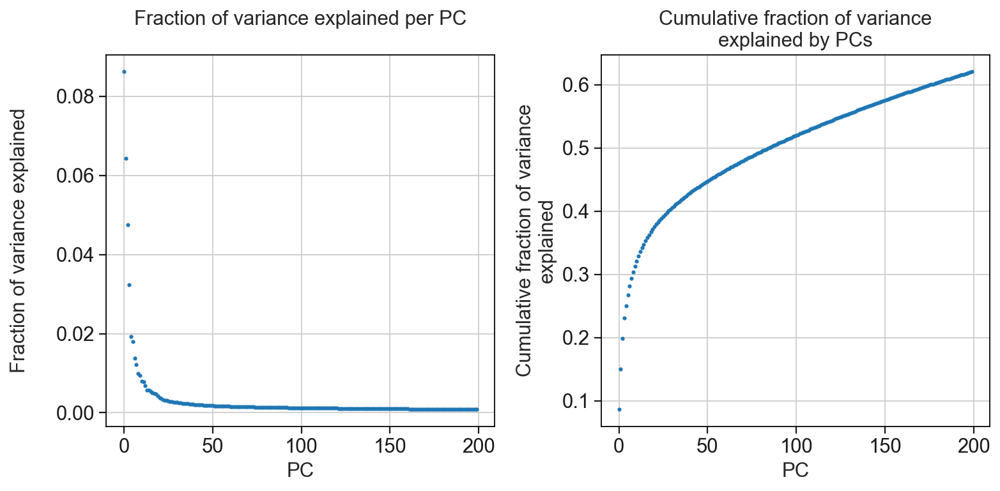

In [74]:
observe_variance(TEC_d147)

In [75]:
#35
rng = np.random.RandomState(42)
sc.tl.pca(TEC_d147, n_comps=35, svd_solver='arpack', random_state=rng, use_highly_variable=True)

computing PCA
    on highly variable genes
    with n_comps=35
    finished (0:00:00)


In [76]:
sce.pp.harmony_integrate(TEC_d147, 'sample')

2024-04-11 10:15:08,130 - harmonypy - INFO - Iteration 1 of 10
2024-04-11 10:15:09,431 - harmonypy - INFO - Iteration 2 of 10
2024-04-11 10:15:10,678 - harmonypy - INFO - Iteration 3 of 10
2024-04-11 10:15:11,923 - harmonypy - INFO - Iteration 4 of 10
2024-04-11 10:15:13,172 - harmonypy - INFO - Iteration 5 of 10
2024-04-11 10:15:14,587 - harmonypy - INFO - Converged after 5 iterations


In [77]:
sc.pp.neighbors(TEC_d147, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(TEC_d147)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


### TEC signatures at steady state

In [78]:
aaTEC1_sign = ['Zbtb20',	'Cd81',	'Trpm3',	'Gstm1',	'Slc16a11',	'Btg1',	'BC006965',	'Cldn3',	'Gsta4',	'S100a11',	'Ly6e',	'Cdk19',	'Slc9a3r1',	'Ifi27l2a',	'Aldoc',	'Wfdc18',	'Phlda1',	'Fam107a',	'Gsn',	'Anxa2']
aaTEC2_sign = ['Csmd1',	'Zeb2',	'Mgp',	'Gsn',	'Zbtb20',	'Ndrg2',	'Serpine2',	'Cd81',	'Fxyd1',	'Laptm4a',	'Gpx3',	'Socs3',	'Igfbp7',	'Airn',	'Lgals1',	'Fos',	'Prrx1',	'Prkg1',	'Sparc',	'Junb']
cTEC_sign = ['Ctsl',	'Cstb',	'Cxcl12',	'Prss16',	'Krt18',	'Gas6',	'Pltp',	'Slc46a2',	'Ndufa11',	'Tbata',	'Ccl25',	'Psmb11',	'Tmem131l',	'Nlgn1',	'Prxl2b',	'Pax1',	'Wnt4',	'Dpp6',	'Psmb9',	'Bnip3l']
early_Pr = ['Apoe',	'Itm2b',	'Dcn',	'Gas6',	'Gas1',	'Rbms3',	'Laptm4a',	'Ctsl',	'Cpne8',	'Mir100hg',	'Gas5',	'Cst3',	'Ly6a',	'Ifitm3',	'Kazald1',	'Mir99ahg',	'Ifitm2',	'Plpp3',	'Oat',	'Auts2']
mTEC1_sign = ['Ccl21a',	'Krt14',	'Krt5',	'Ifitm3',	'Apoe',	'Tpm2',	'Cald1',	'Ifi27l2a',	'Ifitm2',	'Krt17',	'Nxn',	'Ctsl',	'Eya4',	'Rbms3',	'Perp',	'Ly6a',	'Igfbp4',	'Sult5a1',	'Map1lc3a',	'Ank3']
mTECprol_sign = ['H2afz',	'Stmn1',	'Ran',	'Eif5a',	'Hmgb2',	'Ube2s',	'Ybx1',	'Phgdh',	'Ptma',	'Selenoh',	'Ppia',	'Tubb5',	'Nme1',	'Pfn1',	'Ranbp1',	'Hmgn2',	'Hnrnpa1',	'Rbm3',	'Cks1b',	'Banf1']
mTEC2_sign = ['Srgn',	'Ubd',	'Cd52',	'Cyba',	'Cd74',	'H2-Aa',	'Syt1',	'Csn2',	'H2-Eb1',	'S100a14',	'H2-Oa',	'H2-Eb2',	'Hdc',	'Mrpl38',	'Nfkbia',	'Gm48239',	'Aire',	'Nup85',	'Hagh',	'Calcb']
basal_sign = ['Ly6d',	'Dmkn',	'Spink5',	'Fxyd3',	'Skint3',	'Dapl1',	'Hspb1',	'Sfn',	'Tacstd2',	'Pdzk1ip1',	'Prdx5',	'Oit1',	'Cdkn2a',	'Perp',	'Cdkn1a',	'Cdkn2b',	'Gsta4',	'Atox1',	'Lypd3',	'Cst6']
tuft_sign = ['Mctp1',	'Gng13',	'Avil',	'Rgs13',	'Espn',	'Lrmp',	'Anxa4',	'Ltc4s',	'Ptpn18',	'Bmx',	'Cystm1',	'Ivns1abp',	'Fyb',	'Ly6g6f',	'Calm2',	'Ethe1',	'Reep5',	'Lima1',	'1810046K07Rik',	'Abhd2']
nTEC_sign = ['Ptprn2',	'Cacna2d1',	'Car8',	'Scg5',	'Stxbp5l',	'Snap25',	'Chga',	'Cd9',	'Dnajc12',	'Ccser1',	'Pam',	'Camk2n1',	'Syt7',	'Cacna1a',	'Syt1',	'Cacnb2',	'Cystm1',	'Fam183b',	'Cplx2',	'Ceacam10']
goblet_sign = ['Wfdc2',	'Cyp2f2',	'Cxcl17',	'Gsto1',	'S100a11',	'Nupr1',	'Sorbs2',	'Anxa3',	'H2-K1',	'Krt19',	'Fxyd3',	'Ly6d',	'Ly6e',	'Serpinb11',	'Slc12a2',	'Anxa1',	'Ly6a',	'Bace2',	'Aqp5',	'Atp1b1']
Mlike_sign  = ['Ccl20',	'Ccl9',	'Serpinb6a',	'Serpinb1a',	'Tmsb4x',	'2200002D01Rik',	'Nostrin',	'Ctsh',	'Ccl6',	'AW112010',	'Spib',	'Bcl2a1d',	'Csn2',	'Cyp2a5',	'Fabp1',	'Hamp',	'Pold1',	'Bcl2a1b',	'Atox1',	'Iscu']

In [79]:
x=19
sc.tl.score_genes(TEC_d147, gene_list = aaTEC1_sign[0:x],  score_name='aaTEC1_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = aaTEC2_sign[0:x],  score_name='aaTEC2_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = cTEC_sign[0:x],  score_name='cTEC_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = early_Pr[0:x],  score_name='early_Pr', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = mTEC1_sign[0:x],  score_name='mTEC1_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = mTECprol_sign[0:x],  score_name='mTECprol_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = mTEC2_sign[0:x],  score_name='mTEC2_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = basal_sign[0:x],  score_name='basal_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = tuft_sign[0:x],  score_name='tuft_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = nTEC_sign[0:x],  score_name='nTEC_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = goblet_sign[0:x],  score_name='goblet_sign', use_raw=False)
sc.tl.score_genes(TEC_d147, gene_list = Mlike_sign[0:x],  score_name='Mlike_sign', use_raw=False)

computing score 'aaTEC1_sign'
    finished: added
    'aaTEC1_sign', score of gene set (adata.obs).
    298 total control genes are used. (0:00:00)
computing score 'aaTEC2_sign'
    finished: added
    'aaTEC2_sign', score of gene set (adata.obs).
    197 total control genes are used. (0:00:00)
computing score 'cTEC_sign'
    finished: added
    'cTEC_sign', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)
computing score 'early_Pr'
    finished: added
    'early_Pr', score of gene set (adata.obs).
    99 total control genes are used. (0:00:00)
computing score 'mTEC1_sign'
    finished: added
    'mTEC1_sign', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'mTECprol_sign'
    finished: added
    'mTECprol_sign', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
computing score 'mTEC2_sign'
    finished: added
    'mTEC2_sign', score of gene set (adata.obs).
    199 total control g

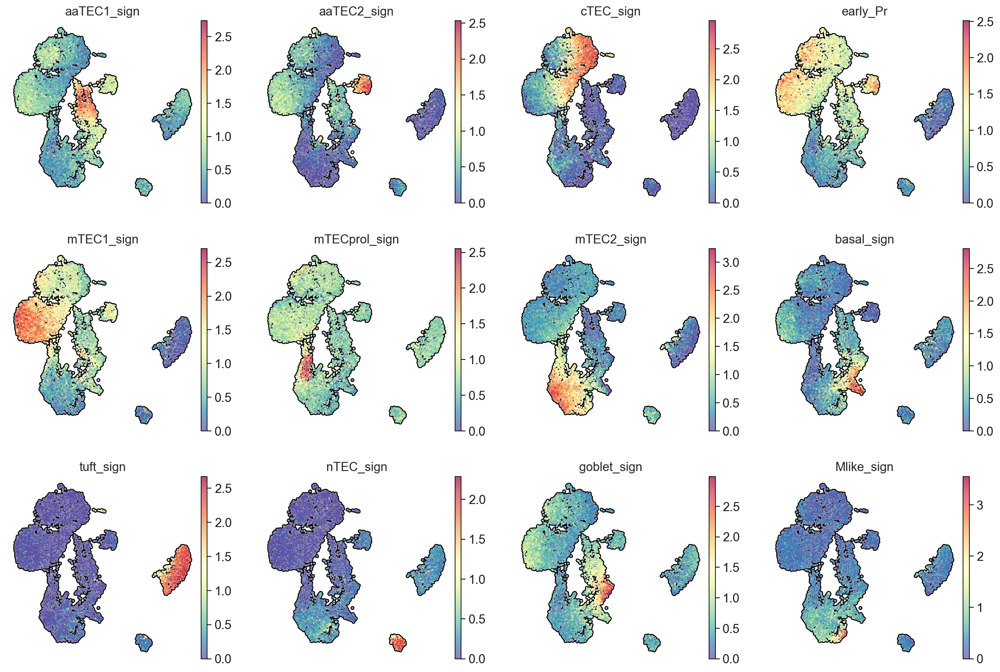

In [80]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    TEC_d147,
    color=['aaTEC1_sign', 'aaTEC2_sign', 'cTEC_sign', 'early_Pr', 'mTEC1_sign', 'mTECprol_sign', 'mTEC2_sign', 
          'basal_sign', 'tuft_sign', 'nTEC_sign', 'goblet_sign','Mlike_sign'],
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=4,
    wspace = 0.2,
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    add_outline=True,
    sort_order = True,
    vmin=0
)

### TEC clustering and annotation

In [81]:
for resolution_parameter in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5,1.6,1.7, 1.8, 1.9, 2.0]:
    sc.tl.leiden(TEC_d147, resolution=resolution_parameter, random_state=42, 
                        key_added='leiden_'+str(resolution_parameter))

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.1', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.2', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 7 clusters and added
    'leiden_0.3', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden_0.4', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.5', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_0.6', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_0.7', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clusteri

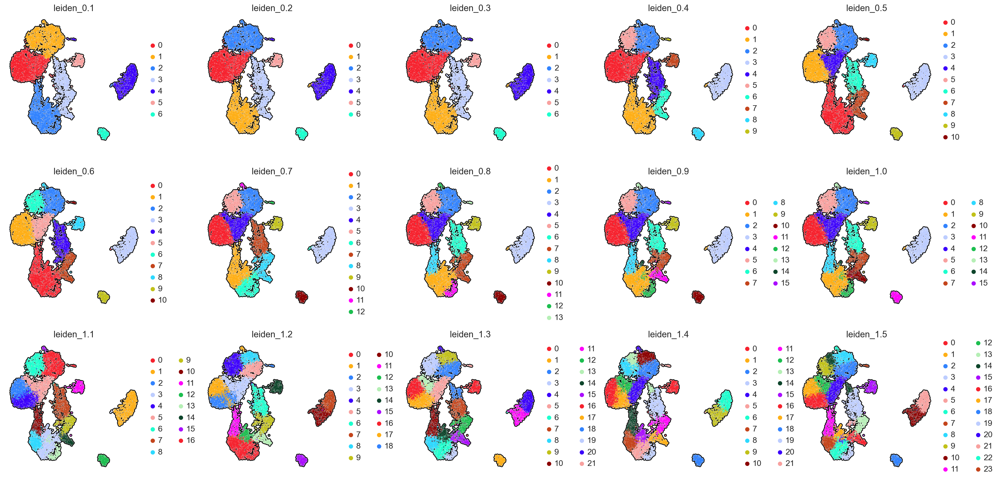

In [82]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)
sc.pl.umap(
    TEC_d147, 
    color=['leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 
           'leiden_0.6', 'leiden_0.7', 'leiden_0.8','leiden_0.9', 'leiden_1.0',
          'leiden_1.1', 'leiden_1.2', 'leiden_1.3','leiden_1.4', 'leiden_1.5'], 
    palette=user_defined_palette,  
    color_map='Spectral_r', 
    use_raw=False,
    ncols=5,
    wspace = 0.3,
    outline_width=[0.6, 0.05],
    frameon=False,
    add_outline=True,
    sort_order = False
)

In [83]:
TEC_d147.obs['cell_type_subset'] = ['11:aaTEC2' if (x=='16') else '10:aaTEC1' if (x=='7' or x=='18') else '12:early Pr' if x=='3' else
                                    '12:cTEC' if (x=='2' or x=='5' or x=='9' or x=='20') else '13:mTEC1' if (x=='0' or x=='1' or x=='13') else 
                                    '14:mTEC-prol' if x=='10' else '15:mTEC2' if (x=='6' or x=='8' or x=='14') else
                                    '16:mimetic(basal)' if (x=='15') else '17:mimetic(tuft)' if (x=='4' or x=='11' or x=='21') else '18:mimetic(neuroendo)' if x=='17' else
                                    '19:mimetic(goblet)' if x=='12' else '20:mimetic(microfold)' if x=='19' else 'ERROR' for x in TEC_d147.obs['leiden_1.3']] 

In [84]:
TEC_d147.uns['cell_type_subset_colors'] = [ '#2ED9FF', '#c1c119', '#8b0000', '#3B00FB', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5', '#BEFFF7', '#FEAF16', '#325A9B', '#C075A6']

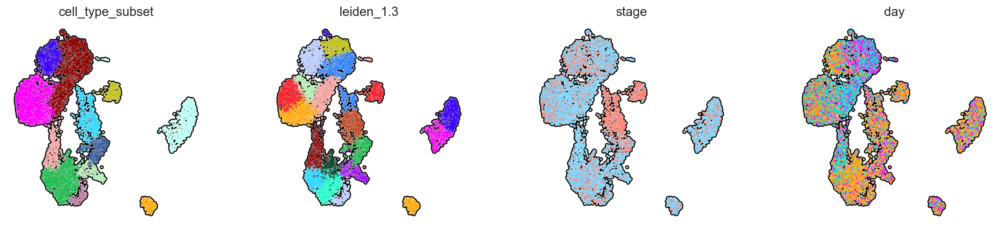

In [85]:
sc.set_figure_params(dpi=80, dpi_save=300, color_map='viridis', vector_friendly=True, transparent=True)

sc.pl.umap(
    TEC_d147, 
    color=['cell_type_subset', 'leiden_1.3', 'stage', 'day'], 
    ncols=6,   
    outline_width=[0.6, 0.05],
    size=15,
    frameon=False,
    cmap='Spectral_r',
    wspace = 0.2,
    add_outline=True,
    legend_loc='none'
)

In [86]:
path_to_h5ad = '../output/anndata_io/FigS13d.h5ad'

In [87]:
TEC_d147.write(path_to_h5ad)

## Transfer annotation

In [82]:
annotated_subsets = pd.concat([EC_d147.obs['cell_type_subset'], FB_d147.obs['cell_type_subset'],  TEC_d147.obs['cell_type_subset'], adata_d147[(adata_d147.obs['cell_type']=='6:MEC') | (adata_d147.obs['cell_type']=='7:vSMC/PC') | (adata_d147.obs['cell_type']=='8:nmSC')].obs['cell_type']])

In [83]:
adata_d147.obs['cell_type_subset']=''

In [84]:
adata_d147.obs['cell_type_subset'][adata_d147.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets

/var/folders/yr/0_lgn5q107n7hthkgy5vt7p40000gq/T/ipykernel_20626/1398286977.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata_d147.obs['cell_type_subset'][adata_d147.obs.index.isin(annotated_subsets.index) == True] = annotated_subsets


In [85]:
adata_d147.uns['cell_type_subset_colors'] = ['#F6222E', '#3283FE', '#16FF32',  '#BDCDFF', '#AA0DFE','#1CFFCE', '#d62728', '#19c9b3','#FFA5D2',   'grey', '#2ED9FF', '#c1c119', '#8b0000', '#3B00FB', '#FE00FA', "#F8A19F", '#1CBE4F','#B5EFB5', '#BEFFF7','#FEAF16', '#325A9B', '#C075A6']

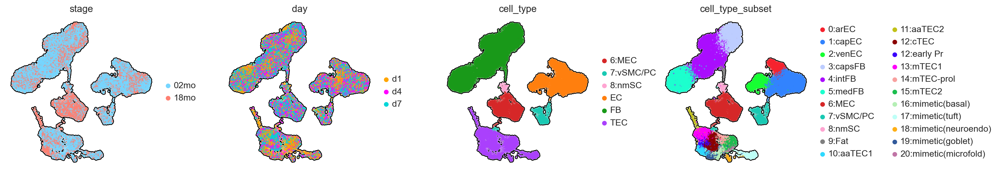

In [86]:
sc.pl.umap(adata_d147, color=['stage', 'day', 'cell_type', 'cell_type_subset'], 
                     color_map='Spectral_r',
                     use_raw=False, 
                     ncols=4, 
                     wspace = 0.3,
                     outline_width=[0.6, 0.05], 
                     size=15,  
                     frameon=False, 
                     add_outline=True, 
                     sort_order = False
)

In [ ]:
path_to_h5ad = '../output/anndata_io/FigED10a++.h5ad'

In [ ]:
adata_d147.write(path_to_h5ad)

In [ ]:
adata_d147 = sc.read_h5ad(path_to_h5ad)
adata_d147.uns['log1p']["base"] = None

## Violin plots for EC, FB, TEC with scanpy v1.4.6

In [12]:
import scanpy as sc
import pandas as pd
pd.set_option('display.max_rows', 200)

sc.set_figure_params(dpi=80, dpi_save=300, color_map='Spectral_r', vector_friendly=True, transparent=True)
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()

scanpy==1.4.6 anndata==0.8.0 umap==0.5.3 numpy==1.23.4 scipy==1.9.3 pandas==1.3.5 scikit-learn==1.1.2 statsmodels==0.13.2


In [24]:
markers = ['Pdgfra',  'Epcam', 'H2-Aa',  'Pecam1', 'Cdh5',  'Nkain4', 'Upk3b', 'Acta2', 'Myl9', 'S100b']

/Users/akousa/opt/anaconda3/envs/sc146_py38/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only
  obs_tidy.set_index(categorical, groupby, inplace=True)


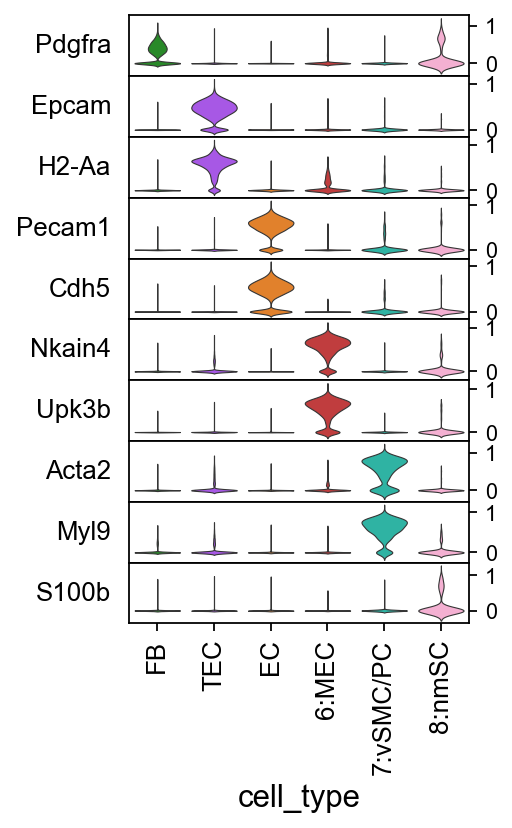

In [31]:
axes = sc.pl.stacked_violin(adata_d147, markers, groupby='cell_type', palette=['#199919', '#aa40fc', '#ff7f0e',
                                                                               '#d62728', '#19c9b3', '#FFA5D2'], standard_scale='var', cut=3, use_raw=False, figsize=(3,5), order = ['FB', 'TEC', 'EC', '6:MEC', '7:vSMC/PC', '8:nmSC'], swap_axes=True, save='_d147.pdf')

In [8]:
EC_markers = ['Pecam1', 'Vwf', 'Vcam1', 'Glul', 'Cldn5', 'Aqp7', 'Car4', 'Kdr', 'Plvap',  'Selp', 'Bmp4']

In [9]:
EC_d147 = adata_d147[adata_d147.obs['cell_type']=='EC']

/Users/akousa/opt/anaconda3/envs/sc146_py38/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only
  obs_tidy.set_index(categorical, groupby, inplace=True)


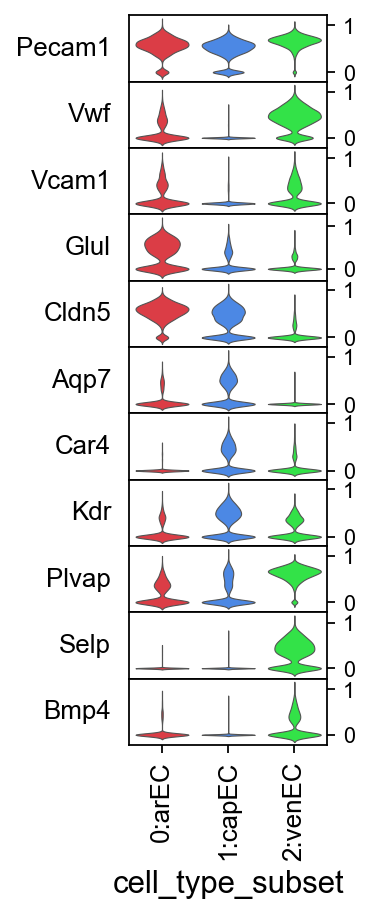

In [10]:
axes = sc.pl.stacked_violin(adata_d147[adata_d147.obs['cell_type']=='EC'], EC_markers, groupby='cell_type_subset', palette=adata_d147[adata_d147.obs['cell_type']=='EC'].uns['cell_type_subset_colors'], standard_scale='var', cut=3, use_raw=False, figsize=(1.75,6), swap_axes=True)

In [14]:
FB_markers = ['Pdgfra', 'Dpp4', 'Fn1',  'Pi16', 'Gpx3', 'Ar', 'Penk', 'Inmt', 'Bmp4', 'Ptn' , 'Postn']

/Users/akousa/opt/anaconda3/envs/sc146_py38/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only
  obs_tidy.set_index(categorical, groupby, inplace=True)


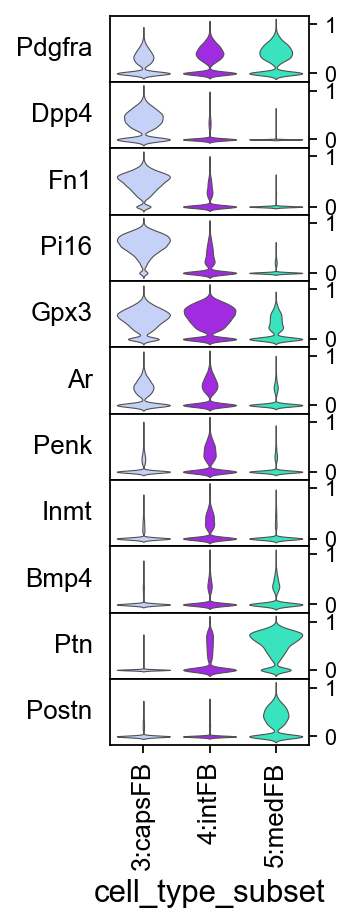

In [15]:
axes = sc.pl.stacked_violin(adata_d147[(adata_d147.obs['cell_type']=='FB') & (adata_d147.obs['cell_type_subset']!='9:Fat')], FB_markers, groupby='cell_type_subset', palette=adata_d147[(adata_d147.obs['cell_type']=='FB') & (adata_d147.obs['cell_type_subset']!='9:Fat')].uns['cell_type_subset_colors'], standard_scale='var', cut=3, use_raw=False, figsize=(1.75,6), swap_axes=True)

In [16]:
TEC_markers =['Epcam', 'H2-Aa',  'Prss16', 'Ccl21a', 'Ccnd2', 'Aire', 'Ly6d',  'Wfdc2', 'Ccl20', 'Car8',  'Avil']

In [19]:
subset_order = ['12:cTEC', '12:early Pr',  '13:mTEC1', '14:mTEC-prol',   '15:mTEC2', '16:mimetic(basal)', '19:mimetic(goblet)', '20:mimetic(microfold)', '18:mimetic(neuroendo)', '17:mimetic(tuft)',  '10:aaTEC1', '11:aaTEC2']

/Users/akousa/opt/anaconda3/envs/sc146_py38/lib/python3.8/site-packages/scanpy/plotting/_anndata.py:2934: FutureWarning: In a future version of pandas all arguments of DataFrame.set_index except for the argument 'keys' will be keyword-only
  obs_tidy.set_index(categorical, groupby, inplace=True)


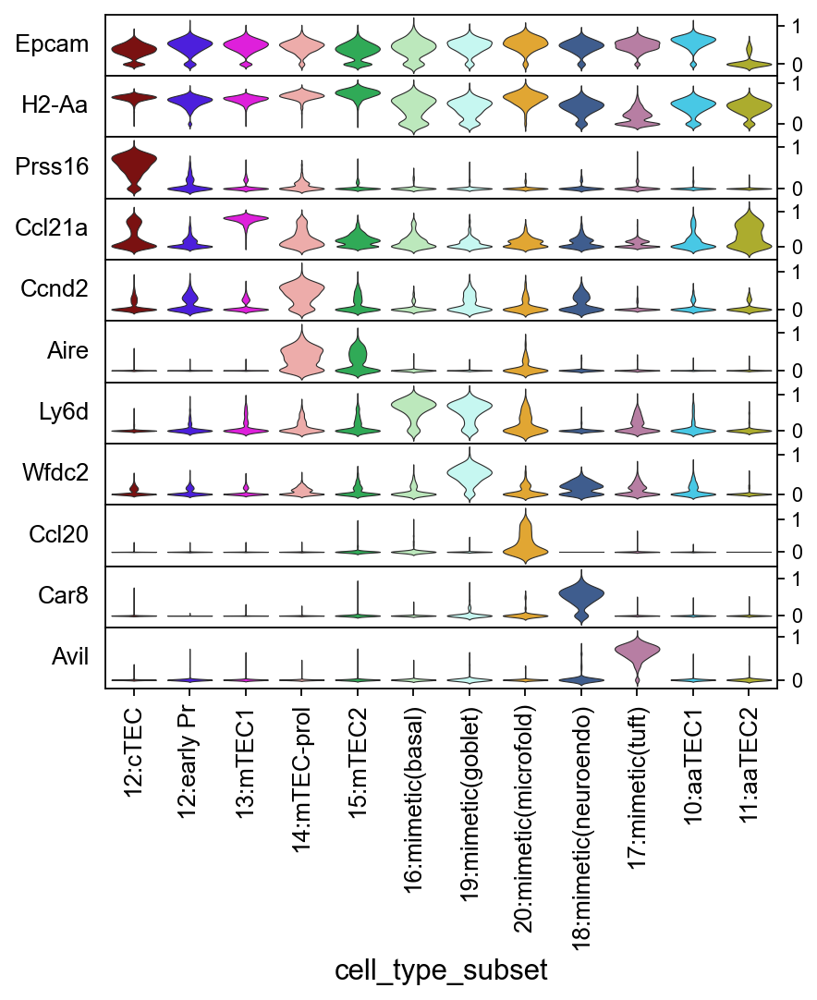

In [20]:
axes = sc.pl.stacked_violin(adata_d147[adata_d147.obs['cell_type']=='TEC'], TEC_markers, groupby='cell_type_subset', palette=['#8b0000', '#3b00fb', '#fe00fa', '#f8a19f',
       '#1cbe4f', '#b5efb5', '#befff7', '#feaf16', '#325a9b', '#c075a6','#2ed9ff', '#c1c119'], standard_scale='var', cut=3, order=subset_order, use_raw=False, figsize=(6.4,6), swap_axes=True)